# Wavesets in Python

The definition of *waveset* is first introduced in {cite}`Wishart1994` as

> a segment of an audio signal between one non-positive to positive zero crossing and the next

The motivation is to cut an audio signal and allow for the re-arangement of its segments without the occurence of clicks caused by a [discontinuity](https://en.wikipedia.org/wiki/Classification_of_discontinuities) of the signal.
The intuition of a discontinuity is that within a certain time-area the signal makes a jump that is too big: the wave needs to re-adjust too quickly to its new position and therefore we here this re-adjustment as a click.

Wavesets tackle this problem as they do place the cutting of the segments at the position where the signal intersects the zero line from negative to positive - therefore one can assume that the beginning and end of each intersection is close to the zero line and therefore (hopefully) allows for re-arranging of the segments without clicks.

The motivation is that we can maybe avoid the clicks that we occured in {doc}`./03_nmf` when we re-arranged the FFT segments by re-arranging wavesets instead of FFT segments.

Before we start programming we want to formalize the notion of wavesets.
Let $S = \lbrace s_0, s_1, \dots, s_n \rbrace$ be our audio signal where $-1 \leq s_i \leq 1$ describes the amplitude of our signal at point $i$.
We then can define the set of indices $A = \lbrace a | s_a < 0 < s_{a+1} \rbrace$ which are the indices when the signal passes the zero-line and the $j$-th waveset $w_j = \lbrace s_i  | s_i \in S, a_j <= i < a_{j+1} \rbrace$.
The set of all Wavesets is then simply $W = \lbrace w_j | j \in 0, 1, \dots, |A| \rbrace$ where $|A|$ is the [cardinality](https://en.wikipedia.org/wiki/Cardinality) of our split set. 

We note that we can reconstruct our signal by simply placing all wavesets in the order that they occur, so $S = \lbrace w_i | i=1,2,\dots |A| \rbrace$.

Note that there is a [SuperCollider implementation](https://github.com/musikinformatik/WavesetsEvent) of Wavesets as a Quark and this notebook wants to explore how we can implement such a thing in Python.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import librosa
import librosa.display
import soundfile
from IPython.display import display, Audio

np.random.seed(42)

We start by loading an audio signal.
For this chapter we will use a new sample from freesound.org called ["trumpetsolo1_hikmet.aiff"](https://freesound.org/people/emirdemirel/sounds/416025/).

In [ ]:
path = 'trumpet.flac'
data, sr = librosa.load(path, sr=None, mono=True)
display(Audio(path))

## Calculating the split points

One thing that is slow when working on high level languages such as Python is the iteration over big or long arrays.
Instead of providing a imperative way in which we describe what to do at each step we therefore want to provide a functional way where the result is described as a function.
It takes a bit of practice but when working with big datasets this is unavoidable as the speed-up is up to 100 because we do not have to switch between optimized C code and Python but can stay within the optimized C code all the time.

We can simply find all split points by applying the [signum function](https://en.wikipedia.org/wiki/Sign_function) on the array and compare two versions of the array: one version is the array as is and another one is the array but shifted by one index (offset 1).
Then we want all the indices where the first array is negative but the second array is positive as this is exactly where we have a transition from a negative to a positive value.

Below is a quick *drawing* on what we do and followed by the code.

```
                      |
offset 0:   + + + + + - - - -
offset 1:   + + + + + + - - - 
                      |
```

In [ ]:
# argwhere gives us the indices of an array where the array is true
split_points = np.argwhere(
    (np.sign(data[:-1])==-1) & (np.sign(data[1:])==1)
)
split_points.shape

(31492, 1)

We can now take a look at how the waveset splitting worked out.

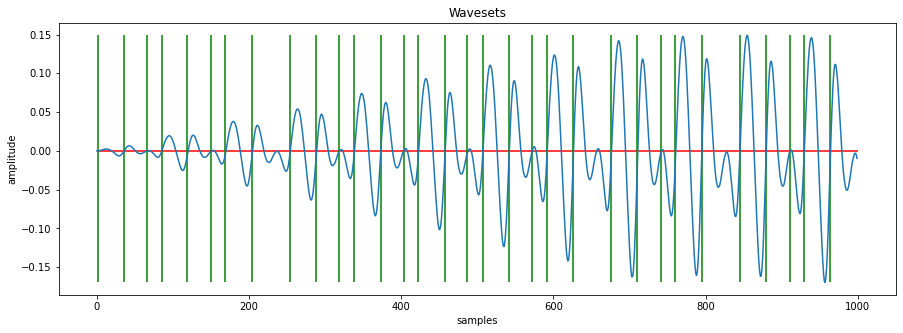

In [ ]:
def plot_wavesets(data, split_points, plot_range):
    data_range = data[plot_range[0]:plot_range[1]]
    plt.figure(figsize=(15, 5))
    plt.plot(data_range)
    plt.hlines(0.0, plot_range[0], plot_range[1], color='r')
    plt.vlines(split_points[(plot_range[0]<split_points) & (split_points<plot_range[1])], data_range.max(), data_range.min(), color='g')
    plt.xlabel("samples")
    plt.ylabel("amplitude")
    plt.title("Wavesets")
    plt.show();

plot_wavesets(data, split_points, plot_range=[0, 1000])

We note that the number of samples which are included within a waveset can be small.
The SuperCollider implementation allows for a minimum size of each waveset.
We can also implement this feature by providing a function which iterates over the array.

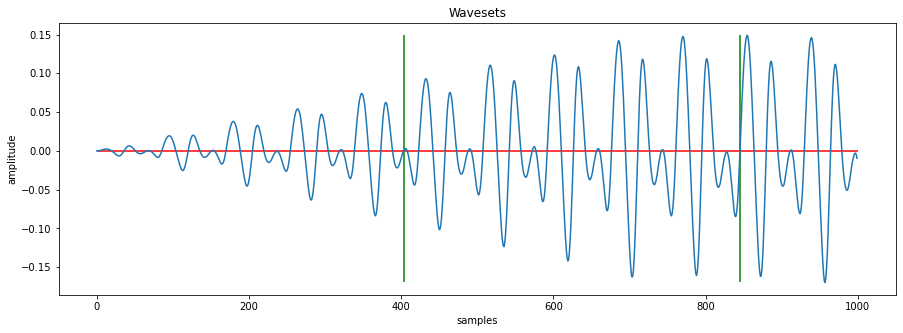

In [ ]:
def apply_min_size_on_splits(splits, min_size=40):
    new_splits = []
    last_split = 0
    
    for split in splits:
        if (split - last_split) > min_size:
            last_split = split
            new_splits.append(split)
    
    return np.array(new_splits)

min_split_points = apply_min_size_on_splits(split_points, min_size=400)

plot_wavesets(data, min_split_points, plot_range=[0, 1000])

We now have only the splitting points (aka boundaries) of the wavesets but we still have not the actual wavesets which we now want to create according to its split points via a function.

In [ ]:
def generate_wavesets(data, split_points):
    wavesets = []
    # we iterate over split points 2 times: once with no offset
    # and a 2nd time with an offset of 1 which gives us
    # the start and the end - zip allows us to iterate
    # over a collection of arrays in parallel
    for start, end in zip(split_points[:-1, 0], split_points[1:, 0]):
        wavesets.append(data[start:end+1])
    return wavesets

wavesets = generate_wavesets(data, min_split_points)

Lets re-arrange these wavesets in a random way.
As the numpy arrays traditionally need to have fixed dimensions (which mean that each sub-array within an array needs the same number of elements) but our wavesets have different kind of lengths we use the data-type of object which ignores the length of the sub-arrays.

In [ ]:
random_wavesets = np.random.permutation(np.array(wavesets, dtype='object'))
# now flatten the re-ordored wavesets into a single array
random_wavesets_signal = np.concatenate(random_wavesets)

display(Audio(data=random_wavesets_signal, rate=sr))

We can now write everything into a class in order to make it quickly reusable.

In [ ]:
from typing import List, Optional

from scipy import signal

class Wavesets:
    def __init__(self, audio_data: np.ndarray, sample_rate: int):
        self.audio_data = audio_data
        self.filter_data = signal.sosfilt(
            signal.butter(100, [100, 400], 'bp', fs=sample_rate, output='sos'),
            self.audio_data
        )
    
    def generate(
        self,
        min_size: int = 40,
        split_absolute: Optional[int] = None,
        use_filter: bool = False,
    ) -> List[np.ndarray]:
        if not split_absolute:
            split_points = self._calculate_split_points(min_size, use_filter)
        else:
            split_points = self._calculate_absolute_equal_points(split_absolute)
        
        wavesets = []
        for start, end in zip(split_points[:-1, 0], split_points[1:, 0]):
            wavesets.append(self.audio_data[start:end])
        return wavesets
    
    @classmethod
    def reorder_wavesets(audio_data: np.ndarray, wavesets: List[np.ndarray], indices: np.ndarray) -> np.ndarray:
        return np.concatenate(np.array(wavesets, dtype='object')[indices])
    
    def _calculate_absolute_equal_points(self, split_value:int):
        # we want to make sure that we are in an upwards movement
        # as otherwise merging /\ can result in a discontinuity
        return np.argwhere((self.audio_data==split_value) & (np.append(data[:-1] < data[1:], False)))
    
    def _calculate_split_points(self, min_size: int, use_filter: bool):
        split_points = np.argwhere(
            (np.sign(self.audio_data[:-1])==-1) & (np.sign(self.audio_data[1:])==1)
        )
        if use_filter:
            filter_splits = np.argwhere(
                (np.sign(self.filter_data[:-1])==-1) & (np.sign(self.filter_data[1:])==1)
            )
            split_points = np.intersect1d(split_points, filter_splits).reshape(-1, 1)
        
        return self._lower_boundary_splits(split_points, min_size)
    
    def _lower_boundary_splits(self, splits: np.ndarray, min_size: int) -> np.ndarray:
        new_splits = []
        last_split = 0
    
        for split in splits:
            if (split - last_split) > min_size:
                last_split = split
                new_splits.append(split)
    
        return np.array(new_splits)

In [ ]:
wavesets = Wavesets(data, sr).generate(min_size=sr/4) # sr/4 equals to 0.25 sec
print(f"Splitted into {len(wavesets)} wavesets")

wavesets_reordered_signal = Wavesets.reorder_wavesets(
    wavesets,
    # indices are sorted after the length of each waveset
    indices=np.argsort([len(w) for w in wavesets])
)

display(Audio(
    data=wavesets_reordered_signal,
    rate=sr,
))

Splitted into 80 wavesets


## Wavesets extensions

Taking the crossing of a zero line as a splitting point can still introduce unwanted *splitting noises* as we take care that the absolute value matches but we ignore the fact that the *steepness* of the connected signals differ and therefore still can introduce splitting noises.

An example where this becomes obvious is the combination of 2 functions which introduce a discontinuity at our splitting point $0$.

$$
f: \mathbb{R} \rightarrow \mathbb{R} \Rightarrow f(x) = \begin{cases}
x^3 &\text{if } x \leq 0 \\
x &\text{if } x > 0
\end{cases}
$$

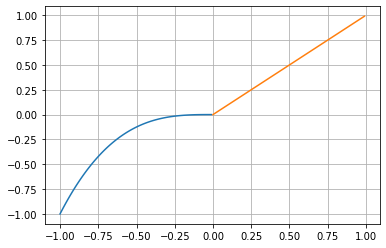

In [ ]:
x = np.arange(-1, 1, 0.01)
y_x3 = np.power(x, 3)
x_0 = np.argwhere(x>=0)[0, 0]
plt.plot(x[0:x_0], y_x3[0:x_0])
plt.plot(x[x_0:], x[x_0:])
plt.grid();

### Using absolute values for splitting

Minimising the deviation points

In [ ]:
# choose a random value 
rand_value = np.random.choice(data)
print(f"Splitting at {rand_value} with {len(np.argwhere(data==rand_value))} occurences")

wavesets = Wavesets(data, sr).generate(split_absolute=rand_value)
wavesets_reordered_signal = Wavesets.reorder_wavesets(
    wavesets,
    # indices are sorted ascending after the length of each waveset
    indices=np.argsort([len(w) for w in wavesets])
)

display(Audio(
    data=wavesets_reordered_signal,
    rate=sr,
))

Splitting at 0.0325927734375 with 141 occurences


### Using filter

To keep acount for the change within a timespan of a signal we use the deviation.
As we have multiple frequencies within our signal we can not just compare the difference between two successive samples (but why not compare the jump from beyond the zero crossing?)

To account for this behaviour we can intersect two splitting points set: one on the original signal and another one on a filtered (e.g. bandpassed) signal.

In [ ]:
wavesets = Wavesets(data, sr).generate(use_filter=True)
wavesets_filtered_signal = Wavesets.reorder_wavesets(
    wavesets,
    # indices are sorted ascending after the length of each waveset
    indices=np.argsort([len(w) for w in wavesets])
)

display(Audio(
    data=wavesets_filtered_signal,
    rate=sr,
))

From here on we can explore the role of deviations for the *splitting noises* as well as calculating the frequency content (FFT) for each of our wavesets and order it with tSNE or else.